# Disease Prediction based on symptoms using NLP

## Data Source
https://archive.ics.uci.edu/dataset/462/drug+review+dataset+drugs+com

## Importing libraries

In [2]:
import os
import zipfile
import pickle
import pandas as pd 
import seaborn as sns
from sklearn.feature_extraction.text import CountVectorizer, TfidfVectorizer
from sklearn.model_selection import train_test_split
from sklearn.linear_model import PassiveAggressiveClassifier
from sklearn.naive_bayes import MultinomialNB
from sklearn import metrics
import matplotlib.pyplot as plt
%matplotlib inline

# To show all the rows of pandas dataframe
pd.set_option('display.max_rows', None)

# To set the width of the column to maximum
pd.set_option('max_colwidth', 1)

## Importing dataset

In [3]:
def unzip_file(zip_path, extract_to):
    with zipfile.ZipFile(zip_path, 'r') as zip_ref:
        zip_ref.extractall(extract_to)

In [4]:
zip_file_path = 'dataset-zip.zip'  
extraction_path = os.getcwd()  
unzip_file(zip_file_path, extraction_path)

In [5]:
train=pd.read_csv('dataset/drugsComTrain_raw.csv')
test=pd.read_csv('dataset/drugsComTest_raw.csv')
df=pd.concat([train,test])

In [6]:
# df = pd.read_csv('dataset/mydrugsmerged.csv')

## Exploratory Data Analysis

In [7]:
df.shape

(215063, 7)

In [8]:
df.head()

,uniqueID,drugName,condition,review,rating,date,usefulCount
0,206461,Valsartan,Left Ventricular Dysfunction,"""It has no side effect, I take it in combination of Bystolic 5 Mg and Fish Oil""",9,"May 20, 2012",27
1,95260,Guanfacine,ADHD,"""My son is halfway through his fourth week of Intuniv. We became concerned when he began this last week, when he started taking the highest dose he will be on. For two days, he could hardly get out of bed, was very cranky, and slept for nearly 8 hours on a drive home from school vacation (very unusual for him.) I called his doctor on Monday morning and she said to stick it out a few days. See how he did at school, and with getting up in the morning. The last two days have been problem free. He is MUCH more agreeable than ever. He is less emotional (a good thing), less cranky. He is remembering all the things he should. Overall his behavior is better. \nWe have tried many different medications and so far this is the most effective.""",8,"April 27, 2010",192
2,92703,Lybrel,Birth Control,"""I used to take another oral contraceptive, which had 21 pill cycle, and was very happy- very light periods, max 5 days, no other side effects. But it contained hormone gestodene, which is not available in US, so I switched to Lybrel, because the ingredients are similar. When my other pills ended, I started Lybrel immediately, on my first day of period, as the instructions said. And the period lasted for two weeks. When taking the second pack- same two weeks. And now, with third pack things got even worse- my third period lasted for two weeks and now it&#039;s the end of the third week- I still have daily brown discharge.\nThe positive side is that I didn&#039;t have any other side effects. The idea of being period free was so tempting... Alas.""",5,"December 14, 2009",17
3,138000,Ortho Evra,Birth Control,"""This is my first time using any form of birth control. I&#039;m glad I went with the patch, I have been on it for 8 months. At first It decreased my libido but that subsided. The only downside is that it made my periods longer (5-6 days to be exact) I used to only have periods for 3-4 days max also made my cramps intense for the first two days of my period, I never had cramps before using birth control. Other than that in happy with the patch""",8,"November 3, 2015",10
4,35696,Buprenorphine / naloxone,Opiate Dependence,"""Suboxone has completely turned my life around. I feel healthier, I&#039;m excelling at my job and I always have money in my pocket and my savings account. I had none of those before Suboxone and spent years abusing oxycontin. My paycheck was already spent by the time I got it and I started resorting to scheming and stealing to fund my addiction. All that is history. If you&#039;re ready to stop, there&#039;s a good chance that suboxone will put you on the path of great life again. I have found the side-effects to be minimal compared to oxycontin. I&#039;m actually sleeping better. Slight constipation is about it for me. It truly is amazing. The cost pales in comparison to what I spent on oxycontin.""",9,"November 27, 2016",37


In [9]:
df.condition.value_counts().head(20)

condition
Birth Control                38436
Depression                   12164
Pain                         8245 
Anxiety                      7812 
Acne                         7435 
Bipolar Disorde              5604 
Insomnia                     4904 
Weight Loss                  4857 
Obesity                      4757 
ADHD                         4509 
Diabetes, Type 2             3362 
Emergency Contraception      3290 
High Blood Pressure          3104 
Vaginal Yeast Infection      3085 
Abnormal Uterine Bleeding    2744 
Bowel Preparation            2498 
Smoking Cessation            2440 
ibromyalgia                  2370 
Migraine                     2277 
Anxiety and Stress           2236 
Name: count, dtype: int64

In [10]:
# column_to_count = df['review']  # Replace 'column_name' with the actual column name

# # Step 3: Calculate the total number of words
# total_words = column_to_count.str.split().apply(len).sum()

# print(f"Total number of words in the {column_to_count} column: {total_words}")

In [11]:
df['date'] = pd.to_datetime(df['date'])

In [12]:
# exploring unique elements in the dataset
print("Number of Unique Drugs present in the Dataset : ", df['drugName'].nunique())
print("Number of Unique Medical Conditions present in the Dataset : ", df['condition'].nunique())

Number of Unique Drugs present in the Dataset :  3671
Number of Unique Medical Conditions present in the Dataset :  916


In [13]:
# checking for missing values
df.isna().sum()

uniqueID       0   
drugName       0   
condition      1194
review         0   
rating         0   
date           0   
usefulCount    0   
dtype: int64

In [14]:
# dropping the missing values of the conditions
df = df.dropna()
df.isna().sum()

uniqueID       0
drugName       0
condition      0
review         0
rating         0
date           0
usefulCount    0
dtype: int64

In [15]:
df['drugName'].value_counts().head(10)

drugName
Levonorgestrel                        4896
Etonogestrel                          4402
Ethinyl estradiol / norethindrone     3619
Nexplanon                             2892
Ethinyl estradiol / norgestimate      2682
Ethinyl estradiol / levonorgestrel    2400
Phentermine                           2077
Sertraline                            1859
Escitalopram                          1739
Mirena                                1673
Name: count, dtype: int64

<Axes: ylabel='condition'>

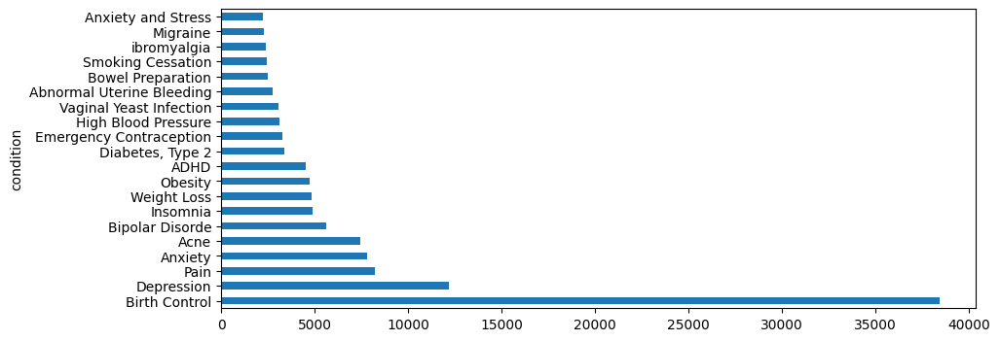

In [16]:
df['condition'].value_counts().head(20).plot(kind='barh', figsize=(10, 4))

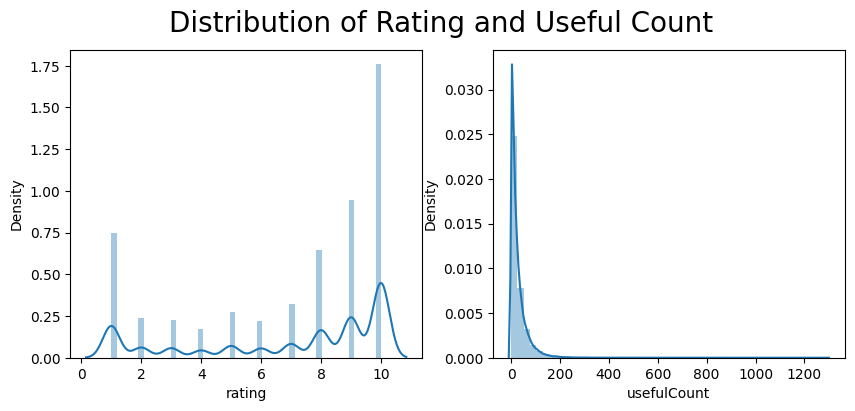

In [17]:
import warnings
warnings.filterwarnings("ignore")

plt.rcParams['figure.figsize'] = (10, 4)

plt.subplot(1, 2, 1)
sns.distplot(df['rating'])

plt.subplot(1, 2, 2)
sns.distplot(df['usefulCount'])

plt.suptitle('Distribution of Rating and Useful Count \n ', fontsize = 20)
plt.show()

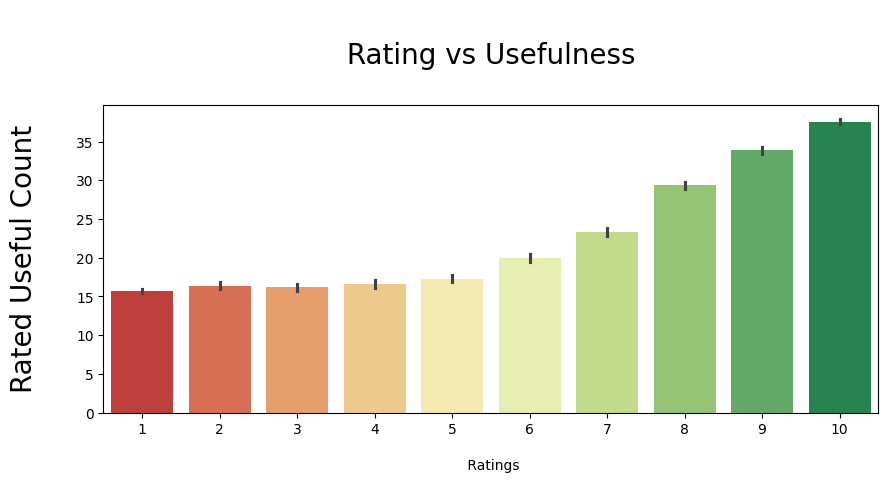

In [18]:
import seaborn as sns

# Define the custom linear gradient color palette
custom_palette = sns.color_palette("RdYlGn", 10)

plt.rcParams['figure.figsize'] = (10, 4)
sns.barplot(x=df['rating'], y=df['usefulCount'], palette=custom_palette)
plt.xlabel('\n Ratings')
plt.ylabel('Rated Useful Count\n', fontsize=20)
plt.title('\n Rating vs Usefulness \n', fontsize=20)
plt.show()


In [19]:
# Aggregate the data to count the number of occurrences for each drug-condition pair
drug_condition_count = df.groupby(['condition', 'drugName']).size().reset_index(name='count')

# Sort the data based on the count to see the most common combinations
sorted_drug_condition_count = drug_condition_count.sort_values(by='count', ascending=False)

# Display the top 20 drug-condition pairs for a sense of the most common combinations
sorted_drug_condition_count.head(20)

,condition,drugName,count
2185,Birth Control,Etonogestrel,4394
2182,Birth Control,Ethinyl estradiol / norethindrone,3081
2215,Birth Control,Levonorgestrel,2884
2251,Birth Control,Nexplanon,2883
2180,Birth Control,Ethinyl estradiol / levonorgestrel,2107
2183,Birth Control,Ethinyl estradiol / norgestimate,2097
3959,Emergency Contraception,Levonorgestrel,1651
9276,Weight Loss,Phentermine,1650
2196,Birth Control,Implanon,1496
9159,Vaginal Yeast Infection,Miconazole,1338


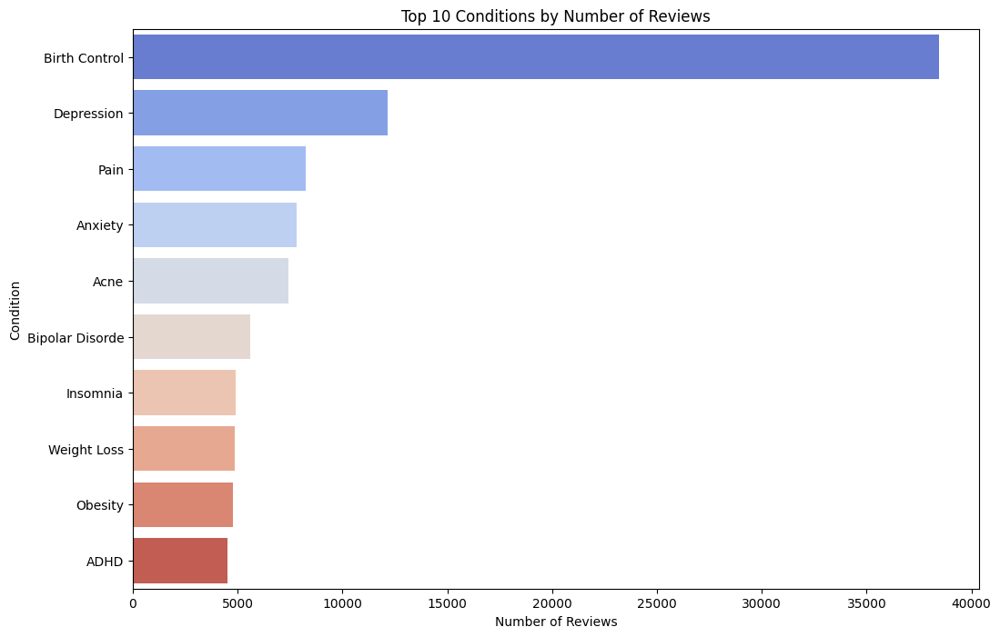

In [20]:
# To make a meaningful graph, let's first aggregate the counts of reviews per condition
condition_count = df['condition'].value_counts().reset_index()
condition_count.columns = ['condition', 'count']

# Select the top 10 conditions to keep the graph interpretable
top_conditions = condition_count.head(10)

# Plotting the top conditions by their count of reviews
plt.figure(figsize=(12, 8))
sns.barplot(x='count', y='condition', data=top_conditions, palette='coolwarm')
plt.title('Top 10 Conditions by Number of Reviews')
plt.xlabel('Number of Reviews')
plt.ylabel('Condition')
plt.show()

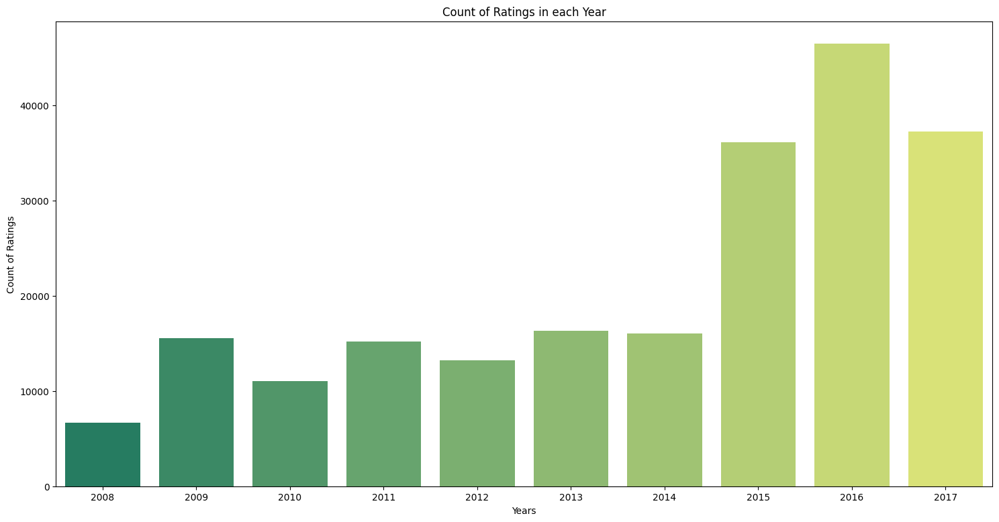

In [21]:
year_ratings = dict(df['date'].dt.year.value_counts())
years = list(year_ratings.keys())
values = list(year_ratings.values())
plt.figure(figsize=(18,9))
sns.barplot(x=years,y=values,palette='summer')
plt.xlabel('Years')
plt.ylabel('Count of Ratings')
plt.title('Count of Ratings in each Year')
plt.show()

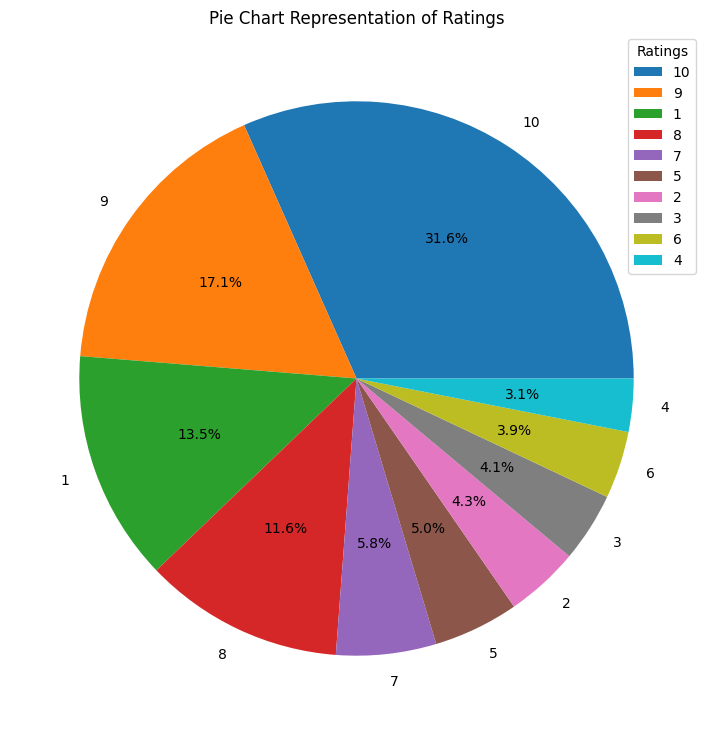

In [22]:
#plotting the percentage distribution of ratings using pie chart

ratings_count = dict(df['rating'].value_counts())
count = list(ratings_count.values())
labels = list(ratings_count.keys())
plt.figure(figsize=(18,9))
plt.pie(count,labels=labels, autopct='%1.1f%%')
plt.title('Pie Chart Representation of Ratings')
plt.legend(title='Ratings')
plt.show()

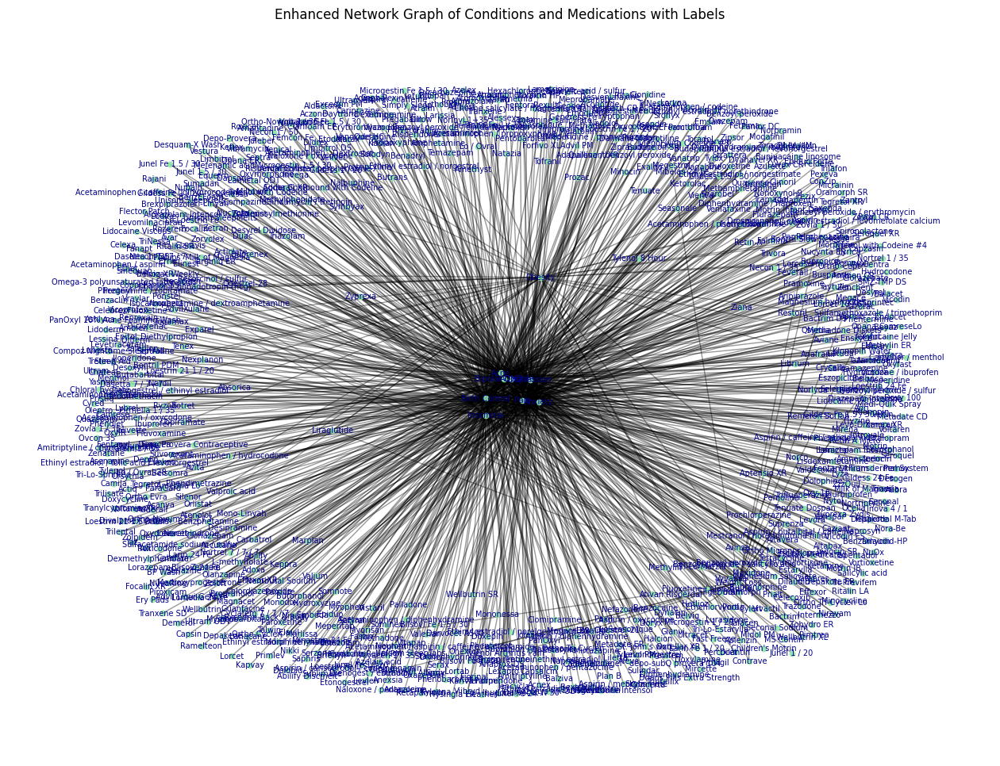

In [23]:
import networkx as nx
import matplotlib.pyplot as plt
from networkx.drawing.nx_agraph import graphviz_layout

# Reduce the dataset to a manageable size by focusing on conditions with the most reviews
top_conditions_list = top_conditions['condition'].tolist()
reduced_df = df[df['condition'].isin(top_conditions_list)]

# Create a graph
G = nx.Graph()

# Add nodes and edges from the reduced dataset
for index, row in reduced_df.iterrows():
    condition = row['condition']
    drug = row['drugName']
    G.add_node(condition, type='condition')
    G.add_node(drug, type='drug')
    G.add_edge(condition, drug)
# Draw the network graph with labels for nodes to identify conditions and medications
plt.figure(figsize=(16, 12))
pos = nx.spring_layout(G, k=0.5, iterations=20)

# Nodes
nx.draw_networkx_nodes(G, pos, node_size=20, node_color='skyblue', alpha=0.6, label=[n for n in G.nodes if G.nodes[n]['type']=='condition'])
nx.draw_networkx_nodes(G, pos, node_size=20, node_color='lightgreen', alpha=0.6, label=[n for n in G.nodes if G.nodes[n]['type']=='drug'])

# Edges
nx.draw_networkx_edges(G, pos, alpha=0.4)

# Labels
nx.draw_networkx_labels(G, pos, font_size=7, font_color='darkblue')

plt.title('Enhanced Network Graph of Conditions and Medications with Labels')
plt.axis('off')
plt.show()

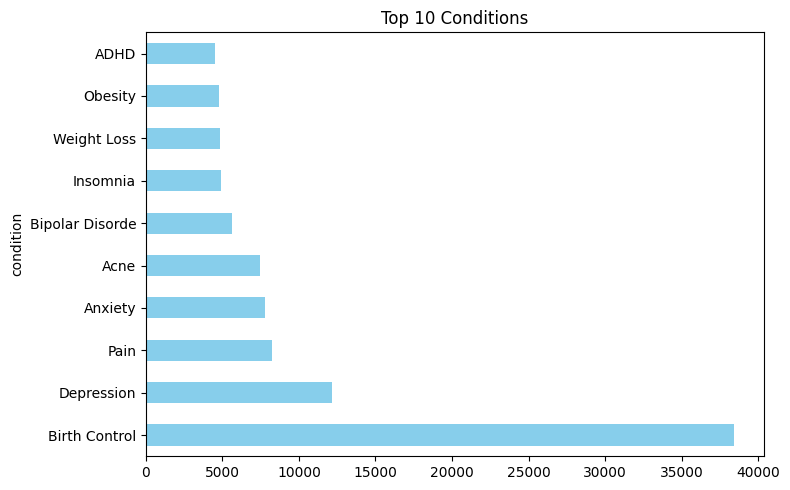

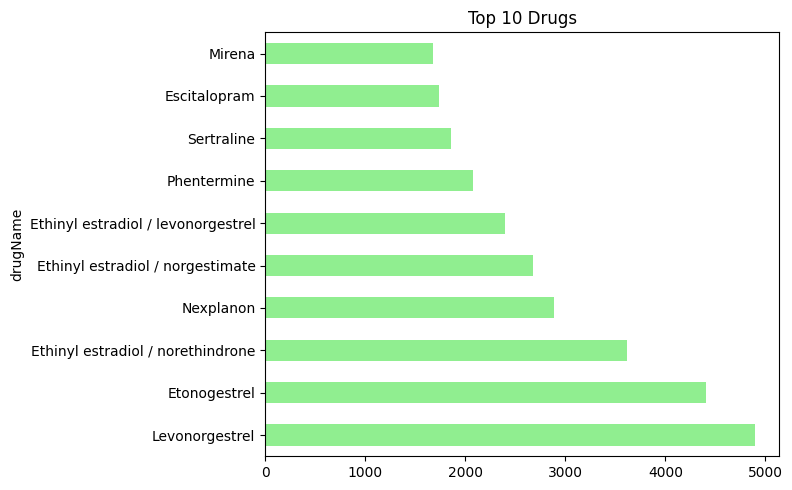

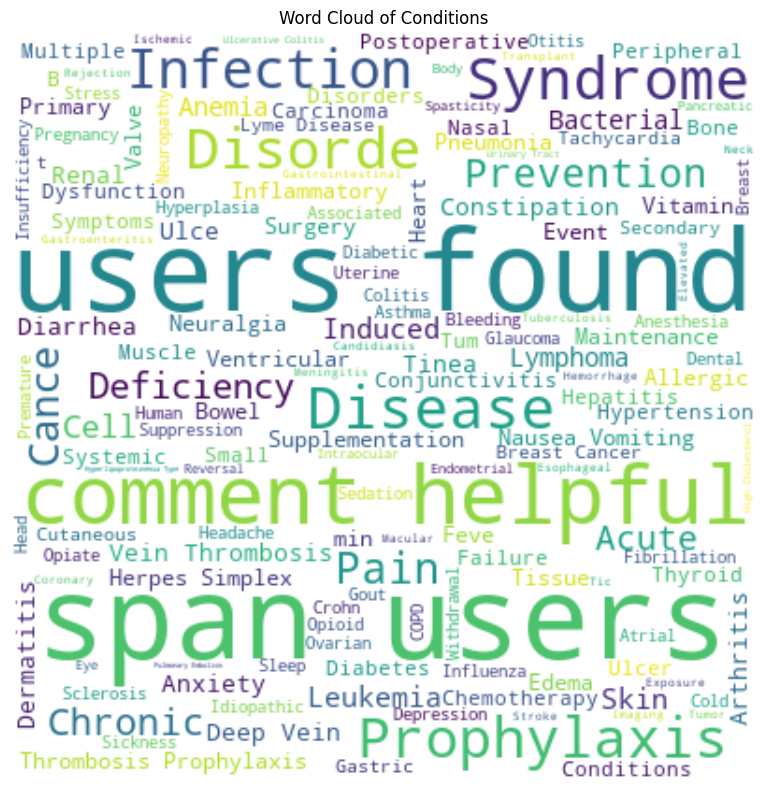

In [24]:
from wordcloud import WordCloud
import matplotlib.pyplot as plt

# Data for bar chart (top conditions and drugs)
top_conditions_data = df['condition'].value_counts().head(10)
top_drugs_data = df['drugName'].value_counts().head(10)

# Mock-up data for model performance (assuming generic values)
accuracy = 0.85
precision = 0.8
recall = 0.75
f1_score = 0.77

# WordCloud for conditions
wordcloud_conditions = WordCloud(background_color='white', width=400, height=400).generate(' '.join(df['condition'].dropna().unique()))

# Bar chart for conditions
plt.figure(figsize=(8, 5))
top_conditions_data.plot(kind='barh', color='skyblue')
plt.title('Top 10 Conditions')
plt.tight_layout()
plt.show()

# Bar chart for drugs
plt.figure(figsize=(8, 5))
top_drugs_data.plot(kind='barh', color='lightgreen')
plt.title('Top 10 Drugs')
plt.tight_layout()
plt.show()

# Model performance summary
# plt.figure(figsize=(8, 5))
# plt.text(0.5, 0.8, f'Accuracy: {accuracy}', ha='center')
# plt.text(0.5, 0.6, f'Precision: {precision}', ha='center')
# plt.text(0.5, 0.4, f'Recall: {recall}', ha='center')
# plt.text(0.5, 0.2, f'F1 Score: {f1_score}', ha='center')
# plt.axis('off')
# plt.title('Model Performance')
# plt.tight_layout()
# plt.show()

# WordCloud for conditions
plt.figure(figsize=(8, 8))
plt.imshow(wordcloud_conditions, interpolation='bilinear')
plt.axis('off')
plt.title('Word Cloud of Conditions')
plt.tight_layout()
plt.show()

#make labels bold

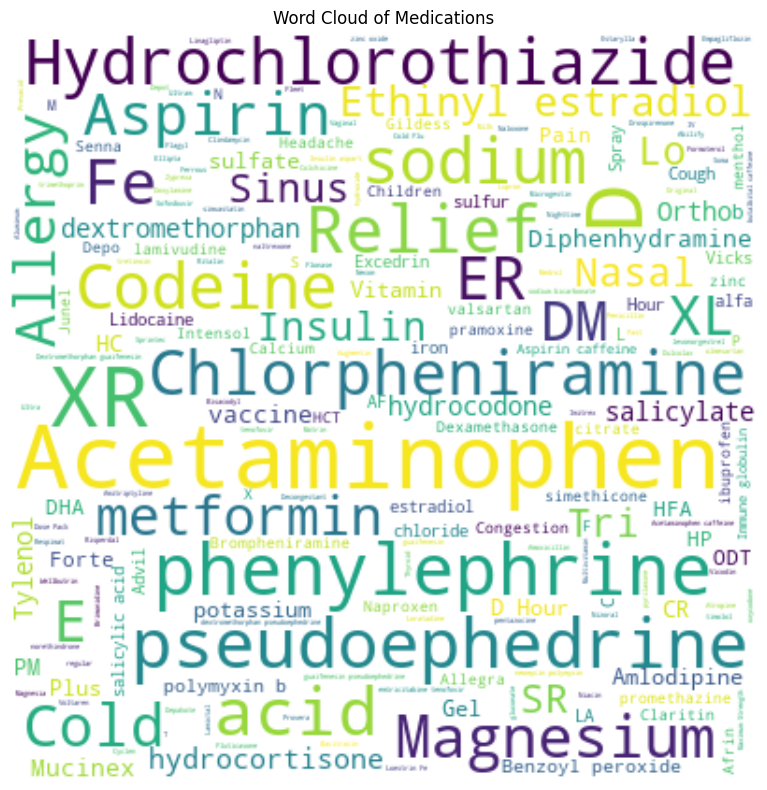

In [25]:
wordcloud_medications = WordCloud(background_color='white', width=400, height=400).generate(' '.join(df['drugName'].dropna().unique()))
plt.figure(figsize=(8, 8))
plt.imshow(wordcloud_medications, interpolation='bilinear')
plt.axis('off')
plt.title('Word Cloud of Medications')
plt.tight_layout()
plt.show()

In [26]:
df_birth=df[(df['condition']=='Birth Control')]
df_dep=df[(df['condition']=='Depression')]
df_bp=df[(df['condition']=='High Blood Pressure')]
df_diab=df[(df['condition']=='Diabetes, Type 2')]

Text(0.5, 1.0, 'Word cloud for Birth control')

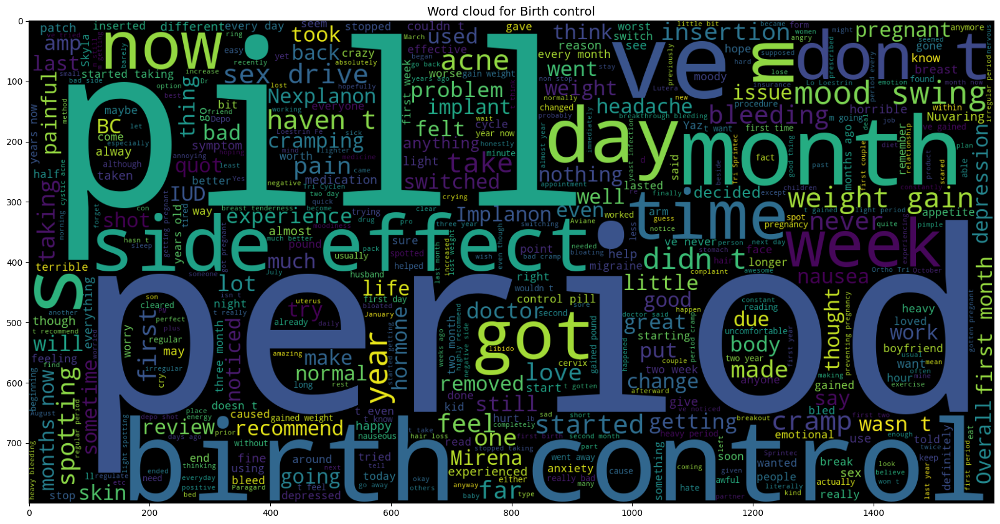

In [27]:
from wordcloud import WordCloud
plt.figure(figsize = (20,20)) # Text that is Fake News Headlines
wc = WordCloud(max_words = 500 , width = 1600 , height = 800).generate(" ".join(df_birth.review))
plt.imshow(wc , interpolation = 'bilinear')
plt.title('Word cloud for Birth control',fontsize=14)

Text(0.5, 1.0, 'Word cloud for Depression')

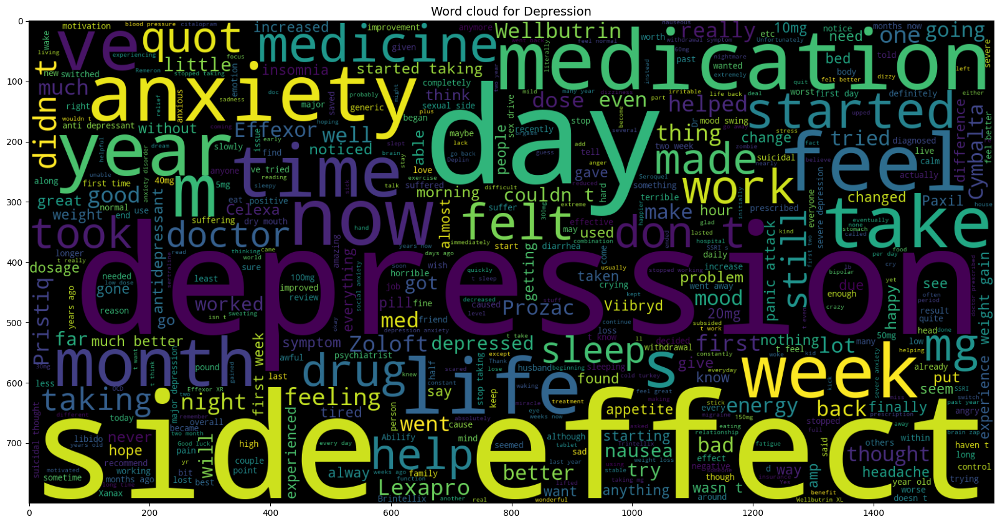

In [28]:
plt.figure(figsize = (20,20)) # Text that is Fake News Headlines
wc = WordCloud(max_words = 500 , width = 1600 , height = 800).generate(" ".join(df_dep.review))
plt.imshow(wc , interpolation = 'bilinear')
plt.title('Word cloud for Depression',fontsize=14)

Text(0.5, 1.0, 'Word cloud for High Blood Pressure')

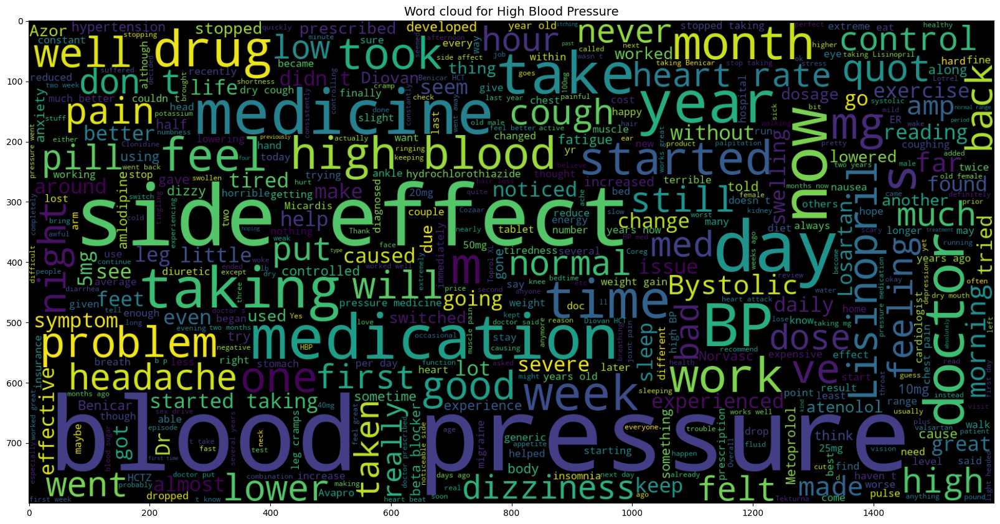

In [29]:
plt.figure(figsize = (20,20)) # Text that is Fake News Headlines
wc = WordCloud(max_words = 500 , width = 1600 , height = 800).generate(" ".join(df_bp.review))
plt.imshow(wc , interpolation = 'bilinear')
plt.title('Word cloud for High Blood Pressure',fontsize=14)

Text(0.5, 1.0, 'Word cloud for Diabetes Type 2')

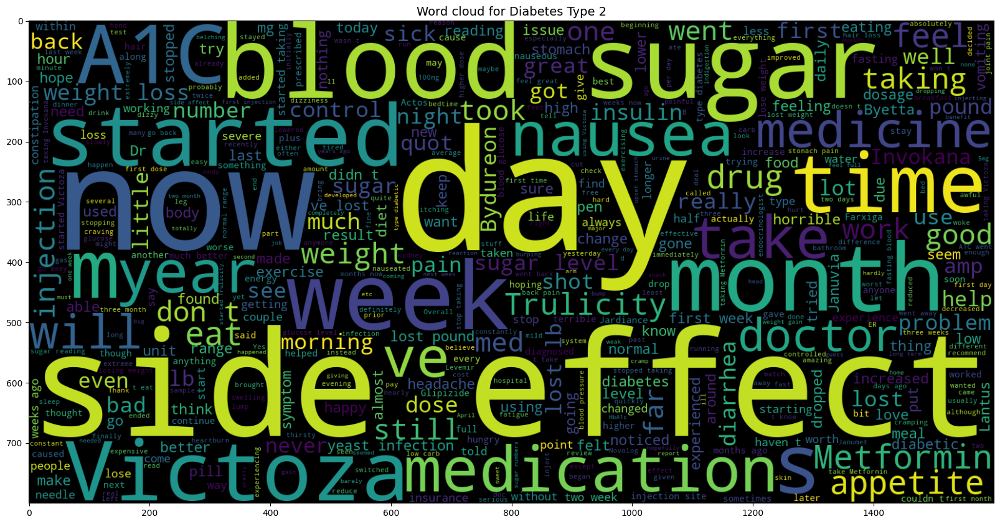

In [30]:
plt.figure(figsize = (20,20)) # Text that is Fake News Headlines
wc = WordCloud(max_words = 500 , width = 1600 , height = 800).generate(" ".join(df_diab.review))
plt.imshow(wc , interpolation = 'bilinear')
plt.title('Word cloud for Diabetes Type 2',fontsize=14)

## Data Preprocessing

In [66]:
df_train = df[(df['condition']).notnull()]

In [67]:
df_train.shape

(213869, 7)

In [68]:
X = df_train.drop(['uniqueID','drugName','rating','date','usefulCount'],axis=1)

In [69]:
X.shape

(213869, 2)

In [70]:
X.condition.value_counts()

condition
Birth Control                                                          38436
Depression                                                             12164
Pain                                                                   8245 
Anxiety                                                                7812 
Acne                                                                   7435 
Bipolar Disorde                                                        5604 
Insomnia                                                               4904 
Weight Loss                                                            4857 
Obesity                                                                4757 
ADHD                                                                   4509 
Diabetes, Type 2                                                       3362 
Emergency Contraception                                                3290 
High Blood Pressure                                               

In [71]:
X.isna().sum()

condition    0
review       0
dtype: int64

In [72]:
#check for duplicate values
X.duplicated().sum()

84805

In [73]:
X.head()

,condition,review
0,Left Ventricular Dysfunction,"""It has no side effect, I take it in combination of Bystolic 5 Mg and Fish Oil"""
1,ADHD,"""My son is halfway through his fourth week of Intuniv. We became concerned when he began this last week, when he started taking the highest dose he will be on. For two days, he could hardly get out of bed, was very cranky, and slept for nearly 8 hours on a drive home from school vacation (very unusual for him.) I called his doctor on Monday morning and she said to stick it out a few days. See how he did at school, and with getting up in the morning. The last two days have been problem free. He is MUCH more agreeable than ever. He is less emotional (a good thing), less cranky. He is remembering all the things he should. Overall his behavior is better. \nWe have tried many different medications and so far this is the most effective."""
2,Birth Control,"""I used to take another oral contraceptive, which had 21 pill cycle, and was very happy- very light periods, max 5 days, no other side effects. But it contained hormone gestodene, which is not available in US, so I switched to Lybrel, because the ingredients are similar. When my other pills ended, I started Lybrel immediately, on my first day of period, as the instructions said. And the period lasted for two weeks. When taking the second pack- same two weeks. And now, with third pack things got even worse- my third period lasted for two weeks and now it&#039;s the end of the third week- I still have daily brown discharge.\nThe positive side is that I didn&#039;t have any other side effects. The idea of being period free was so tempting... Alas."""
3,Birth Control,"""This is my first time using any form of birth control. I&#039;m glad I went with the patch, I have been on it for 8 months. At first It decreased my libido but that subsided. The only downside is that it made my periods longer (5-6 days to be exact) I used to only have periods for 3-4 days max also made my cramps intense for the first two days of my period, I never had cramps before using birth control. Other than that in happy with the patch"""
4,Opiate Dependence,"""Suboxone has completely turned my life around. I feel healthier, I&#039;m excelling at my job and I always have money in my pocket and my savings account. I had none of those before Suboxone and spent years abusing oxycontin. My paycheck was already spent by the time I got it and I started resorting to scheming and stealing to fund my addiction. All that is history. If you&#039;re ready to stop, there&#039;s a good chance that suboxone will put you on the path of great life again. I have found the side-effects to be minimal compared to oxycontin. I&#039;m actually sleeping better. Slight constipation is about it for me. It truly is amazing. The cost pales in comparison to what I spent on oxycontin."""


In [74]:
X['review'][2]

2    "I used to take another oral contraceptive, which had 21 pill cycle, and was very happy- very light periods, max 5 days, no other side effects. But it contained hormone gestodene, which is not available in US, so I switched to Lybrel, because the ingredients are similar. When my other pills ended, I started Lybrel immediately, on my first day of period, as the instructions said. And the period lasted for two weeks. When taking the second pack- same two weeks. And now, with third pack things got even worse- my third period lasted for two weeks and now it&#039;s the end of the third week- I still have daily brown discharge.\nThe positive side is that I didn&#039;t have any other side effects. The idea of being period free was so tempting... Alas."
2    "Quick reduction of symptoms"                                                                                                                                                                                                             

In [75]:
X['review'][11]

11    "I have taken anti-depressants for years, with some improvement but mostly moderate to severe side affects, which makes me go off them.\n\nI only take Cymbalta now mostly for pain.\n\nWhen I began Deplin, I noticed a major improvement overnight. More energy, better disposition, and no sinking to the low lows of major depression. I have been taking it for about 3 months now and feel like a normal person for the first time ever. Best thing, no side effects."
11    "Honestly its day one on the 3 day treatment. Yes it burns a bit and it does leak out if you dont lay down after insertion. But im faithful it will work."                                                                                                                                                                                                                                                                                                                  
Name: review, dtype: object

In [76]:
for i, col in enumerate(X.columns):
    X.iloc[:, i] = X.iloc[:, i].str.replace('"', '')

In [77]:
X['review'][11]

11    I have taken anti-depressants for years, with some improvement but mostly moderate to severe side affects, which makes me go off them.\n\nI only take Cymbalta now mostly for pain.\n\nWhen I began Deplin, I noticed a major improvement overnight. More energy, better disposition, and no sinking to the low lows of major depression. I have been taking it for about 3 months now and feel like a normal person for the first time ever. Best thing, no side effects.
11    Honestly its day one on the 3 day treatment. Yes it burns a bit and it does leak out if you dont lay down after insertion. But im faithful it will work.                                                                                                                                                                                                                                                                                                                  
Name: review, dtype: object

In [78]:
X.head()

,condition,review
0,Left Ventricular Dysfunction,"It has no side effect, I take it in combination of Bystolic 5 Mg and Fish Oil"
1,ADHD,"My son is halfway through his fourth week of Intuniv. We became concerned when he began this last week, when he started taking the highest dose he will be on. For two days, he could hardly get out of bed, was very cranky, and slept for nearly 8 hours on a drive home from school vacation (very unusual for him.) I called his doctor on Monday morning and she said to stick it out a few days. See how he did at school, and with getting up in the morning. The last two days have been problem free. He is MUCH more agreeable than ever. He is less emotional (a good thing), less cranky. He is remembering all the things he should. Overall his behavior is better. \nWe have tried many different medications and so far this is the most effective."
2,Birth Control,"I used to take another oral contraceptive, which had 21 pill cycle, and was very happy- very light periods, max 5 days, no other side effects. But it contained hormone gestodene, which is not available in US, so I switched to Lybrel, because the ingredients are similar. When my other pills ended, I started Lybrel immediately, on my first day of period, as the instructions said. And the period lasted for two weeks. When taking the second pack- same two weeks. And now, with third pack things got even worse- my third period lasted for two weeks and now it&#039;s the end of the third week- I still have daily brown discharge.\nThe positive side is that I didn&#039;t have any other side effects. The idea of being period free was so tempting... Alas."
3,Birth Control,"This is my first time using any form of birth control. I&#039;m glad I went with the patch, I have been on it for 8 months. At first It decreased my libido but that subsided. The only downside is that it made my periods longer (5-6 days to be exact) I used to only have periods for 3-4 days max also made my cramps intense for the first two days of my period, I never had cramps before using birth control. Other than that in happy with the patch"
4,Opiate Dependence,"Suboxone has completely turned my life around. I feel healthier, I&#039;m excelling at my job and I always have money in my pocket and my savings account. I had none of those before Suboxone and spent years abusing oxycontin. My paycheck was already spent by the time I got it and I started resorting to scheming and stealing to fund my addiction. All that is history. If you&#039;re ready to stop, there&#039;s a good chance that suboxone will put you on the path of great life again. I have found the side-effects to be minimal compared to oxycontin. I&#039;m actually sleeping better. Slight constipation is about it for me. It truly is amazing. The cost pales in comparison to what I spent on oxycontin."


## Stopwords

In [79]:
import nltk
nltk.download('stopwords')
nltk.download('wordnet')

[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\suhas\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package wordnet to
[nltk_data]     C:\Users\suhas\AppData\Roaming\nltk_data...
[nltk_data]   Package wordnet is already up-to-date!


True

In [80]:
from nltk.corpus import stopwords

stop = stopwords.words('english')


In [81]:
stop

['i',
 'me',
 'my',
 'myself',
 'we',
 'our',
 'ours',
 'ourselves',
 'you',
 "you're",
 "you've",
 "you'll",
 "you'd",
 'your',
 'yours',
 'yourself',
 'yourselves',
 'he',
 'him',
 'his',
 'himself',
 'she',
 "she's",
 'her',
 'hers',
 'herself',
 'it',
 "it's",
 'its',
 'itself',
 'they',
 'them',
 'their',
 'theirs',
 'themselves',
 'what',
 'which',
 'who',
 'whom',
 'this',
 'that',
 "that'll",
 'these',
 'those',
 'am',
 'is',
 'are',
 'was',
 'were',
 'be',
 'been',
 'being',
 'have',
 'has',
 'had',
 'having',
 'do',
 'does',
 'did',
 'doing',
 'a',
 'an',
 'the',
 'and',
 'but',
 'if',
 'or',
 'because',
 'as',
 'until',
 'while',
 'of',
 'at',
 'by',
 'for',
 'with',
 'about',
 'against',
 'between',
 'into',
 'through',
 'during',
 'before',
 'after',
 'above',
 'below',
 'to',
 'from',
 'up',
 'down',
 'in',
 'out',
 'on',
 'off',
 'over',
 'under',
 'again',
 'further',
 'then',
 'once',
 'here',
 'there',
 'when',
 'where',
 'why',
 'how',
 'all',
 'any',
 'both',
 'each

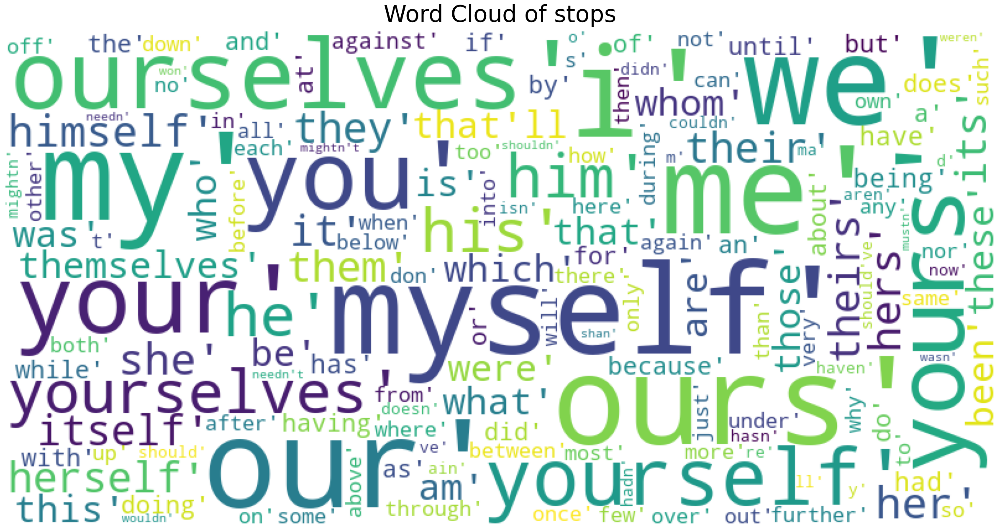

In [82]:
#https://www.kaggle.com/sudalairajkumar/simple-exploration-notebook-qiqc kernel 
from wordcloud import WordCloud, STOPWORDS

# Thanks : https://www.kaggle.com/aashita/word-clouds-of-various-shapes ##
def plot_wordcloud(text, mask=None, max_words=200, max_font_size=100, figure_size=(24.0,16.0), 
                   title = None, title_size=40, image_color=False):
    stopwords = set(STOPWORDS)
    more_stopwords = {'one', 'br', 'Po', 'th', 'sayi', 'fo', 'Unknown'}
    stopwords = stopwords.union(more_stopwords)

    wordcloud = WordCloud(background_color='white',
                    stopwords = stopwords,
                    max_words = max_words,
                    max_font_size = max_font_size, 
                    random_state = 42,
                    width=800, 
                    height=400,
                    mask = mask)
    wordcloud.generate(str(text))
    
    plt.figure(figsize=figure_size)
    if image_color:
        image_colors = ImageColorGenerator(mask);
        plt.imshow(wordcloud.recolor(color_func=image_colors), interpolation="bilinear");
        plt.title(title, fontdict={'size': title_size,  
                                  'verticalalignment': 'bottom'})
    else:
        plt.imshow(wordcloud);
        plt.title(title, fontdict={'size': title_size, 'color': 'black', 
                                  'verticalalignment': 'bottom'})
    plt.axis('off');
    plt.tight_layout()  
    
plot_wordcloud(stop, title="Word Cloud of stops")

In [83]:
not_stop = ["aren't","couldn't","didn't","doesn't","don't","hadn't","hasn't","haven't","isn't","mightn't","mustn't","needn't","no","nor","not","shan't","shouldn't","wasn't","weren't","wouldn't"]
for i in not_stop:
    stop.remove(i)

## Lemmitization

In [84]:
from nltk.stem import WordNetLemmatizer
from nltk.stem import PorterStemmer

porter = PorterStemmer()

lemmatizer = WordNetLemmatizer()

In [85]:
print(porter.stem("sportingly"))
print(porter.stem("very"))
print(porter.stem("troubled"))

sportingli
veri
troubl


In [86]:
print(lemmatizer.lemmatize("sportingly"))
print(lemmatizer.lemmatize("very"))
print(lemmatizer.lemmatize("troubled"))

sportingly
very
troubled


## Review Cleaning

In [87]:
from bs4 import BeautifulSoup
import re

In [88]:
def review_to_words(raw_review):
    # 1. Delete HTML 
    review_text = BeautifulSoup(raw_review, 'html.parser').get_text()
    # 2. Make a space
    letters_only = re.sub('[^a-zA-Z]', ' ', review_text)
    # 3. lower letters
    words = letters_only.lower().split()
    # 5. Stopwords 
    meaningful_words = [w for w in words if not w in stop]
    # 6. lemmitization
    lemmitize_words = [lemmatizer.lemmatize(w) for w in meaningful_words]
    # 7. space join words
    return( ' '.join(lemmitize_words))

In [89]:
X['review_clean'] = X['review'].apply(review_to_words)

In [90]:
X.head()

,condition,review,review_clean
0,Left Ventricular Dysfunction,"It has no side effect, I take it in combination of Bystolic 5 Mg and Fish Oil",no side effect take combination bystolic mg fish oil
1,ADHD,"My son is halfway through his fourth week of Intuniv. We became concerned when he began this last week, when he started taking the highest dose he will be on. For two days, he could hardly get out of bed, was very cranky, and slept for nearly 8 hours on a drive home from school vacation (very unusual for him.) I called his doctor on Monday morning and she said to stick it out a few days. See how he did at school, and with getting up in the morning. The last two days have been problem free. He is MUCH more agreeable than ever. He is less emotional (a good thing), less cranky. He is remembering all the things he should. Overall his behavior is better. \nWe have tried many different medications and so far this is the most effective.",son halfway fourth week intuniv became concerned began last week started taking highest dose two day could hardly get bed cranky slept nearly hour drive home school vacation unusual called doctor monday morning said stick day see school getting morning last two day problem free much agreeable ever le emotional good thing le cranky remembering thing overall behavior better tried many different medication far effective
2,Birth Control,"I used to take another oral contraceptive, which had 21 pill cycle, and was very happy- very light periods, max 5 days, no other side effects. But it contained hormone gestodene, which is not available in US, so I switched to Lybrel, because the ingredients are similar. When my other pills ended, I started Lybrel immediately, on my first day of period, as the instructions said. And the period lasted for two weeks. When taking the second pack- same two weeks. And now, with third pack things got even worse- my third period lasted for two weeks and now it&#039;s the end of the third week- I still have daily brown discharge.\nThe positive side is that I didn&#039;t have any other side effects. The idea of being period free was so tempting... Alas.",used take another oral contraceptive pill cycle happy light period max day no side effect contained hormone gestodene not available u switched lybrel ingredient similar pill ended started lybrel immediately first day period instruction said period lasted two week taking second pack two week third pack thing got even worse third period lasted two week end third week still daily brown discharge positive side side effect idea period free tempting ala
3,Birth Control,"This is my first time using any form of birth control. I&#039;m glad I went with the patch, I have been on it for 8 months. At first It decreased my libido but that subsided. The only downside is that it made my periods longer (5-6 days to be exact) I used to only have periods for 3-4 days max also made my cramps intense for the first two days of my period, I never had cramps before using birth control. Other than that in happy with the patch",first time using form birth control glad went patch month first decreased libido subsided downside made period longer day exact used period day max also made cramp intense first two day period never cramp using birth control happy patch
4,Opiate Dependence,"Suboxone has completely turned my life around. I feel healthier, I&#039;m excelling at my job and I always have money in my pocket and my savings account. I had none of those before Suboxone and spent years abusing oxycontin. My paycheck was already spent by the time I got it and I started resorting to scheming and stealing to fund my addiction. All that is history. If you&#039;re ready to stop, there&#039;s a good chance that suboxone will put you on the path of great life again. I have found the side-effects to be minimal compared to oxycontin. I&#039;m actually sleeping better. Slight constipation is about it for me. It truly is amazing. The cost pales in comparison to what I 

In [91]:
X['review_clean'][11]

11    taken anti depressant year improvement mostly moderate severe side affect make go take cymbalta mostly pain began deplin noticed major improvement overnight energy better disposition no sinking low low major depression taking month feel like normal person first time ever best thing no side effect
11    honestly day one day treatment yes burn bit leak dont lay insertion im faithful work                                                                                                                                                                                                                     
Name: review_clean, dtype: object

## Creating features and Target Variable

In [92]:
X_feat = X['review_clean']
y = X['condition']

In [96]:
X_train, X_test, y_train, y_test = train_test_split(X_feat, y,stratify=y,test_size=0.2, random_state=0)

ValueError: The least populated class in y has only 1 member, which is too few. The minimum number of groups for any class cannot be less than 2.

## Bag of Words

In [ ]:
count_vectorizer = CountVectorizer(stop_words='english')

count_train = count_vectorizer.fit_transform(X_train)

count_test = count_vectorizer.transform(X_test)

In [ ]:
from sklearn.feature_extraction.text import CountVectorizer

# Assuming X_train is your training data

# Initialize the CountVectorizer with English stop words
count_vectorizer = CountVectorizer(stop_words='english')

# Fit and transform the training data
count_train = count_vectorizer.fit_transform(X_train)


In [ ]:
# from sklearn.feature_extraction.text import CountVectorizer

# # Example sentence from the image provided by the user.
# sentence = df.head(10)['review'].tolist()

# # Initialize CountVectorizer: Since the image shows that stopwords are not removed we won't remove them here
# vectorizer = CountVectorizer()

# # Fit the vectorizer to the data
# bag_of_words = vectorizer.fit_transform(sentence)

# # Get the feature names to use as columns in a DataFrame
# feature_names = vectorizer.get_feature_names_out()

# # Create a DataFrame for the bag of words matrix
# df_bag_of_words = pd.DataFrame(bag_of_words.toarray(), columns=feature_names)

# # Display the DataFrame
# df_bag_of_words


In [ ]:
df.head(10)['review'].tolist()

['"It has no side effect, I take it in combination of Bystolic 5 Mg and Fish Oil"',
 '"My son is halfway through his fourth week of Intuniv. We became concerned when he began this last week, when he started taking the highest dose he will be on. For two days, he could hardly get out of bed, was very cranky, and slept for nearly 8 hours on a drive home from school vacation (very unusual for him.) I called his doctor on Monday morning and she said to stick it out a few days. See how he did at school, and with getting up in the morning. The last two days have been problem free. He is MUCH more agreeable than ever. He is less emotional (a good thing), less cranky. He is remembering all the things he should. Overall his behavior is better. \nWe have tried many different medications and so far this is the most effective."',
 '"I used to take another oral contraceptive, which had 21 pill cycle, and was very happy- very light periods, max 5 days, no other side effects. But it contained hormone

## Directory Creation

In [ ]:
# Create the "models" folder if it doesn't exist
if not os.path.exists("models"):
    os.makedirs("models")
    
if not os.path.exists("vectorizers"):
    os.makedirs("vectorizers")

## Sentiment Analysis

In [ ]:
from textblob import TextBlob
from tqdm import tqdm
reviews = df['review']

Predict_Sentiment = []
for review in tqdm(reviews):
    blob = TextBlob(review)
    Predict_Sentiment += [blob.sentiment.polarity]
df["Predict_Sentiment"] = Predict_Sentiment
df.head()

  0%|          | 169/213869 [00:00<02:07, 1675.19it/s]

100%|██████████| 213869/213869 [01:46<00:00, 2000.27it/s]


,uniqueID,drugName,condition,review,rating,date,usefulCount,Predict_Sentiment
0,206461,Valsartan,Left Ventricular Dysfunction,"""It has no side effect, I take it in combination of Bystolic 5 Mg and Fish Oil""",9,2012-05-20,27,0.000000
1,95260,Guanfacine,ADHD,"""My son is halfway through his fourth week of Intuniv. We became concerned when he began this last week, when he started taking the highest dose he will be on. For two days, he could hardly get out of bed, was very cranky, and slept for nearly 8 hours on a drive home from school vacation (very unusual for him.) I called his doctor on Monday morning and she said to stick it out a few days. See how he did at school, and with getting up in the morning. The last two days have been problem free. He is MUCH more agreeable than ever. He is less emotional (a good thing), less cranky. He is remembering all the things he should. Overall his behavior is better. \nWe have tried many different medications and so far this is the most effective.""",8,2010-04-27,192,0.168333
2,92703,Lybrel,Birth Control,"""I used to take another oral contraceptive, which had 21 pill cycle, and was very happy- very light periods, max 5 days, no other side effects. But it contained hormone gestodene, which is not available in US, so I switched to Lybrel, because the ingredients are similar. When my other pills ended, I started Lybrel immediately, on my first day of period, as the instructions said. And the period lasted for two weeks. When taking the second pack- same two weeks. And now, with third pack things got even worse- my third period lasted for two weeks and now it&#039;s the end of the third week- I still have daily brown discharge.\nThe positive side is that I didn&#039;t have any other side effects. The idea of being period free was so tempting... Alas.""",5,2009-12-14,17,0.067210
3,138000,Ortho Evra,Birth Control,"""This is my first time using any form of birth control. I&#039;m glad I went with the patch, I have been on it for 8 months. At first It decreased my libido but that subsided. The only downside is that it made my periods longer (5-6 days to be exact) I used to only have periods for 3-4 days max also made my cramps intense for the first two days of my period, I never had cramps before using birth control. Other than that in happy with the patch""",8,2015-11-03,10,0.179545
4,35696,Buprenorphine / naloxone,Opiate Dependence,"""Suboxone has completely turned my life around. I feel healthier, I&#039;m excelling at my job and I always have money in my pocket and my savings account. I had none of those before Suboxone and spent years abusing oxycontin. My paycheck was already spent by the time I got it and I started resorting to scheming and stealing to fund my addiction. All that is history. If you&#039;re ready to stop, there&#039;s a good chance that suboxone will put you on the path of great life again. I have found the side-effects to be minimal compared to oxycontin. I&#039;m actually sleeping better. Slight constipation is about it for me. It truly is amazing. The cost pales in comparison to what I spent on oxycontin.""",9,2016-11-27,37,0.194444


In [ ]:
df['sentiment'] = df["rating"].apply(lambda x: 1 if x > 5 else 0)
df.head()

,uniqueID,drugName,condition,review,rating,date,usefulCount,Predict_Sentiment,sentiment
0,206461,Valsartan,Left Ventricular Dysfunction,"""It has no side effect, I take it in combination of Bystolic 5 Mg and Fish Oil""",9,2012-05-20,27,0.000000,1
1,95260,Guanfacine,ADHD,"""My son is halfway through his fourth week of Intuniv. We became concerned when he began this last week, when he started taking the highest dose he will be on. For two days, he could hardly get out of bed, was very cranky, and slept for nearly 8 hours on a drive home from school vacation (very unusual for him.) I called his doctor on Monday morning and she said to stick it out a few days. See how he did at school, and with getting up in the morning. The last two days have been problem free. He is MUCH more agreeable than ever. He is less emotional (a good thing), less cranky. He is remembering all the things he should. Overall his behavior is better. \nWe have tried many different medications and so far this is the most effective.""",8,2010-04-27,192,0.168333,1
2,92703,Lybrel,Birth Control,"""I used to take another oral contraceptive, which had 21 pill cycle, and was very happy- very light periods, max 5 days, no other side effects. But it contained hormone gestodene, which is not available in US, so I switched to Lybrel, because the ingredients are similar. When my other pills ended, I started Lybrel immediately, on my first day of period, as the instructions said. And the period lasted for two weeks. When taking the second pack- same two weeks. And now, with third pack things got even worse- my third period lasted for two weeks and now it&#039;s the end of the third week- I still have daily brown discharge.\nThe positive side is that I didn&#039;t have any other side effects. The idea of being period free was so tempting... Alas.""",5,2009-12-14,17,0.067210,0
3,138000,Ortho Evra,Birth Control,"""This is my first time using any form of birth control. I&#039;m glad I went with the patch, I have been on it for 8 months. At first It decreased my libido but that subsided. The only downside is that it made my periods longer (5-6 days to be exact) I used to only have periods for 3-4 days max also made my cramps intense for the first two days of my period, I never had cramps before using birth control. Other than that in happy with the patch""",8,2015-11-03,10,0.179545,1
4,35696,Buprenorphine / naloxone,Opiate Dependence,"""Suboxone has completely turned my life around. I feel healthier, I&#039;m excelling at my job and I always have money in my pocket and my savings account. I had none of those before Suboxone and spent years abusing oxycontin. My paycheck was already spent by the time I got it and I started resorting to scheming and stealing to fund my addiction. All that is history. If you&#039;re ready to stop, there&#039;s a good chance that suboxone will put you on the path of great life again. I have found the side-effects to be minimal compared to oxycontin. I&#039;m actually sleeping better. Slight constipation is about it for me. It truly is amazing. The cost pales in comparison to what I spent on oxycontin.""",9,2016-11-27,37,0.194444,1


In [ ]:
from sklearn.pipeline import Pipeline
from sklearn.feature_extraction.text import CountVectorizer, TfidfTransformer
pipeline = Pipeline([
    ('vect', CountVectorizer()),
    ('tfidf', TfidfTransformer()),
    ('clf', MultinomialNB()),
])

## Machine Learning Model : Naive Bayes

In [ ]:
mnb = MultinomialNB()
mnb.fit(count_train, y_train)

with open("models/multinomial_nb_model.pkl", "wb") as file:
    pickle.dump(mnb, file)
    
pred = mnb.predict(count_test)
naive_bayes_score = metrics.accuracy_score(y_test, pred)
print("Accuracy :   %0.3f" % naive_bayes_score)

Accuracy :   0.903


## Machine Learning Model : Passive Aggressive Classifier

In [ ]:
passive = PassiveAggressiveClassifier()
passive.fit(count_train, y_train)

with open("models/passive_aggressive_model.pkl", "wb") as file:
    pickle.dump(passive, file)
    
pred = passive.predict(count_test)
pass_aggr_score = metrics.accuracy_score(y_test, pred)
print("Accuracy:   %0.3f" % pass_aggr_score)


Accuracy:   0.926


## Machine Learning Model : TFIDF

In [ ]:
tfidf_vectorizer = TfidfVectorizer(stop_words='english', max_df=0.8)
tfidf_train = tfidf_vectorizer.fit_transform(X_train)
tfidf_test = tfidf_vectorizer.transform(X_test)

pass_tf = PassiveAggressiveClassifier()
pass_tf.fit(tfidf_train, y_train)

with open("models/tfidf_model.pkl", "wb") as file:
    pickle.dump(pass_tf, file)
    
pred = pass_tf.predict(tfidf_test)
ml_tfidf_score = metrics.accuracy_score(y_test, pred)
print("Accuracy:   %0.3f" % ml_tfidf_score)


Accuracy:   0.940


## TFIDF: Bigrams

In [ ]:
tfidf_vectorizer2 = TfidfVectorizer(stop_words='english', max_df=0.8, ngram_range=(1,2))
tfidf_train_2 = tfidf_vectorizer2.fit_transform(X_train)
tfidf_test_2 = tfidf_vectorizer2.transform(X_test)

pass_tf = PassiveAggressiveClassifier()
pass_tf.fit(tfidf_train_2, y_train)

with open("models/tfidf_bigrams_model.pkl", "wb") as file:
    pickle.dump(pass_tf, file)
   
with open("vectorizers/tfidf_vectorizer2.pkl", "wb") as f:
    pickle.dump(tfidf_vectorizer2, f)
    
pred = pass_tf.predict(tfidf_test_2)
bi_tfidf_score = metrics.accuracy_score(y_test, pred)
print("Accuracy:   %0.3f" % bi_tfidf_score)


Accuracy:   0.961


## TFIDF : Trigrams

In [ ]:
tfidf_vectorizer3 = TfidfVectorizer(stop_words='english', max_df=0.8, ngram_range=(1,3)) #n-grams: string of elements like text 
tfidf_train_3 = tfidf_vectorizer3.fit_transform(X_train)
tfidf_test_3 = tfidf_vectorizer3.transform(X_test)

pass_tf = PassiveAggressiveClassifier()
pass_tf.fit(tfidf_train_3, y_train)

with open("models/tfidf_trigrams_model.pkl", "wb") as file:
    pickle.dump(pass_tf, file)
   
with open("vectorizers/tfidf_vectorizer3.pkl", "wb") as f:
    pickle.dump(tfidf_vectorizer3, f)
    
pred = pass_tf.predict(tfidf_test_3)
tri_tfidf_score = metrics.accuracy_score(y_test, pred)
print("Accuracy:   %0.3f" % tri_tfidf_score)


Accuracy:   0.962


In [ ]:
tfidf_vectorizer3 = TfidfVectorizer(stop_words='english', max_df=0.8, ngram_range=(1,3)) #n-grams: string of elements like text 
tfidf_train_3 = tfidf_vectorizer3.fit_transform(X_train)
tfidf_test_3 = tfidf_vectorizer3.transform(X_test)

from sklearn.svm import LinearSVC
pass_tf = LinearSVC()
pass_tf.fit(tfidf_train_3, y_train)
    
pred = pass_tf.predict(tfidf_test_3)
tri_tfidf_score = metrics.accuracy_score(y_test, pred)
print("Accuracy:   %0.3f" % tri_tfidf_score)

Accuracy:   0.962


<Axes: >

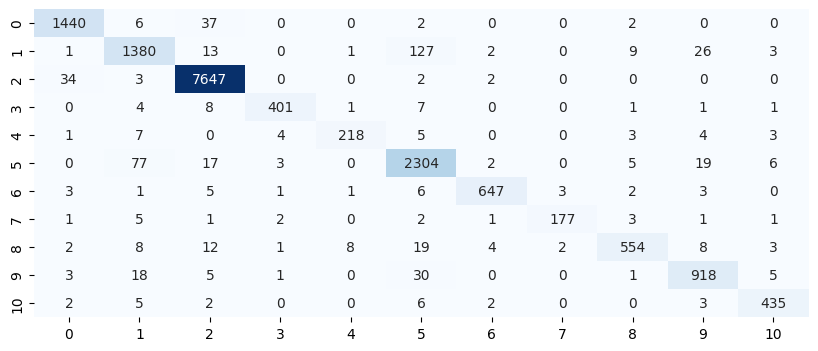

In [ ]:
from sklearn.metrics import confusion_matrix

confusion_matrix(y_test, pred)
sns.heatmap(confusion_matrix(y_test, pred), annot=True, fmt='d', cmap='Blues', cbar=False)

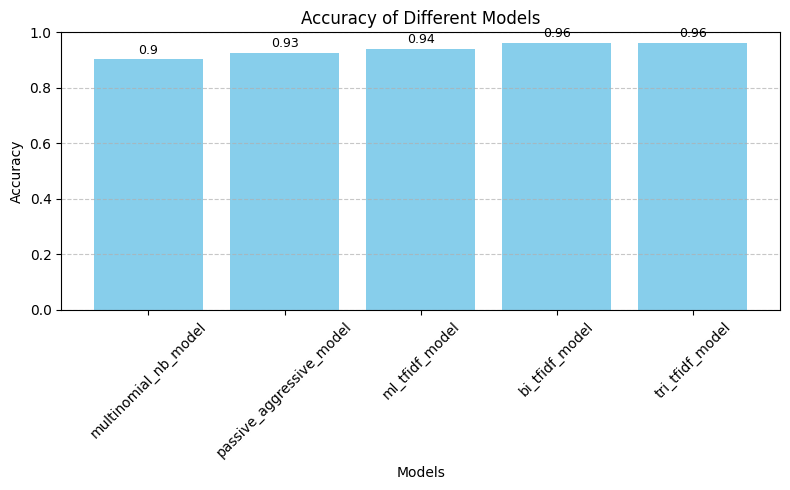

In [ ]:
import matplotlib.pyplot as plt

# Create a bar graph to compare the accuracy of each model
models = ['multinomial_nb_model', 'passive_aggressive_model', 'ml_tfidf_model', 'bi_tfidf_model', 'tri_tfidf_model']
accuracy = [naive_bayes_score, pass_aggr_score, ml_tfidf_score, bi_tfidf_score, tri_tfidf_score]

plt.figure(figsize=(8, 5))
plt.bar(models, accuracy, color='skyblue')
plt.xlabel('Models')
plt.ylabel('Accuracy')
plt.title('Accuracy of Different Models')
plt.ylim(0, 1)  # Set the y-axis limits
plt.xticks(rotation=45)  # Rotate x-axis labels for better readability
plt.grid(axis='y', linestyle='--', alpha=0.7)  # Add horizontal grid lines
for i, v in enumerate(accuracy):
    plt.text(i, v + 0.01, str(round(v, 2)), ha='center', va='bottom', fontsize=9)  # Add text labels on bars
plt.tight_layout()  # Adjust layout to prevent clipping of labels
plt.show()


In [ ]:
from sklearn.pipeline import Pipeline
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.model_selection import cross_validate
from sklearn.naive_bayes import MultinomialNB
from sklearn.linear_model import PassiveAggressiveClassifier
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score
import numpy as np

# Define pipelines
pipeline_mnb = Pipeline([
    ('tfidf', TfidfVectorizer(stop_words='english')),
    ('clf', MultinomialNB())
])

pipeline_passive = Pipeline([
    ('tfidf', TfidfVectorizer(stop_words='english')),
    ('clf', PassiveAggressiveClassifier())
])

pipeline_ml_tfidf = Pipeline([
    ('tfidf', TfidfVectorizer(stop_words='english')),
    ('clf', PassiveAggressiveClassifier())
])

pipeline_bi_tfidf = Pipeline([
    ('tfidf', TfidfVectorizer(stop_words='english', ngram_range=(1, 2))),
    ('clf', PassiveAggressiveClassifier())
])

pipeline_tri_tfidf = Pipeline([
    ('tfidf', TfidfVectorizer(stop_words='english', ngram_range=(1, 3))),
    ('clf', PassiveAggressiveClassifier())
])

# Define the metrics to be used for evaluation
scoring = {'accuracy': 'accuracy',
           'precision_macro': 'precision_macro',
           'recall_macro': 'recall_macro',
           'f1_macro': 'f1_macro'}

# Perform cross-validation for each model
cv_results_mnb = cross_validate(pipeline_mnb, X_train, y_train, cv=5, scoring=scoring)
cv_results_passive = cross_validate(pipeline_passive, X_train, y_train, cv=5, scoring=scoring)
cv_results_ml_tfidf = cross_validate(pipeline_ml_tfidf, X_train, y_train, cv=5, scoring=scoring)
cv_results_bi_tfidf = cross_validate(pipeline_bi_tfidf, X_train, y_train, cv=5, scoring=scoring)
cv_results_tri_tfidf = cross_validate(pipeline_tri_tfidf, X_train, y_train, cv=5, scoring=scoring)

# Calculate mean scores for each metric
mean_scores_mnb = {metric: np.mean(cv_results_mnb[f'test_{metric}']) for metric in scoring}
mean_scores_passive = {metric: np.mean(cv_results_passive[f'test_{metric}']) for metric in scoring}
mean_scores_ml_tfidf = {metric: np.mean(cv_results_ml_tfidf[f'test_{metric}']) for metric in scoring}
mean_scores_bi_tfidf = {metric: np.mean(cv_results_bi_tfidf[f'test_{metric}']) for metric in scoring}
mean_scores_tri_tfidf = {metric: np.mean(cv_results_tri_tfidf[f'test_{metric}']) for metric in scoring}

# Print mean scores for each model
print("Mean scores for Multinomial Naive Bayes:")
print(mean_scores_mnb)
print()
print("Mean scores for Passive Aggressive:")
print(mean_scores_passive)
print()
print("Mean scores for Machine Learning TF-IDF:")
print(mean_scores_ml_tfidf)
print()
print("Mean scores for Bigram TF-IDF:")
print(mean_scores_bi_tfidf)
print()
print("Mean scores for Trigram TF-IDF:")
print(mean_scores_tri_tfidf)


In [ ]:
# Calculate loss for each model
loss_mnb = 1 - mean_scores_mnb['accuracy']
loss_passive = 1 - mean_scores_passive['accuracy']
loss_ml_tfidf = 1 - mean_scores_ml_tfidf['accuracy']
loss_bi_tfidf = 1 - mean_scores_bi_tfidf['accuracy']
loss_tri_tfidf = 1 - mean_scores_tri_tfidf['accuracy']

# Print loss for each model
print("Loss for Multinomial Naive Bayes:", loss_mnb)
print("Loss for Passive Aggressive:", loss_passive)
print("Loss for Machine Learning TF-IDF:", loss_ml_tfidf)
print("Loss for Bigram TF-IDF:", loss_bi_tfidf)
print("Loss for Trigram TF-IDF:", loss_tri_tfidf)


Loss for Multinomial Naive Bayes: 0.22458387404462954
Loss for Passive Aggressive: 0.07241515156261491
Loss for Machine Learning TF-IDF: 0.07234057256097903
Loss for Bigram TF-IDF: 0.05208520739374456
Loss for Trigram TF-IDF: 0.05078751808130855


In [ ]:
'''
import pandas as pd
from sklearn.datasets import fetch_20newsgroups
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.linear_model import LogisticRegression, RidgeClassifier
from sklearn.naive_bayes import MultinomialNB
from sklearn.svm import LinearSVC
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score
from sklearn.model_selection import train_test_split

# Load dataset
data = fetch_20newsgroups(subset='all', shuffle=True, random_state=42)

# Split data into train and test sets
X_train, X_test, y_train, y_test = train_test_split(data.data, data.target, test_size=0.2, random_state=42)

# Define models
models = {
    "LogisticRegression": LogisticRegression(),
    "RidgeClassifier": RidgeClassifier(),
    "MultinomialNB": MultinomialNB(),
    "LinearSVC": LinearSVC()
}

# Vectorize data
vectorizer = CountVectorizer()
X_train_vec = vectorizer.fit_transform(X_train)
X_test_vec = vectorizer.transform(X_test)

# Results list to store model metrics
results = []

# Iterate over models
for model_name, model in models.items():
    # Train model
    model.fit(X_train_vec, y_train)

    # Test model
    y_pred = model.predict(X_test_vec)

    # Calculate metrics
    accuracy = accuracy_score(y_test, y_pred)
    precision = precision_score(y_test, y_pred, average='weighted')
    recall = recall_score(y_test, y_pred, average='weighted')
    f1 = f1_score(y_test, y_pred, average='weighted')

    # Append results
    results.append([model_name, precision, recall, f1, accuracy])

# Convert results to DataFrame
results_df = pd.DataFrame(results, columns=["Model", "Precision", "Recall", "F1", "Accuracy"])
    
# Print table
print("TABLE BAG-OF-WORDS")
print(results_df)
'''


'\nimport pandas as pd\nfrom sklearn.datasets import fetch_20newsgroups\nfrom sklearn.feature_extraction.text import CountVectorizer\nfrom sklearn.linear_model import LogisticRegression, RidgeClassifier\nfrom sklearn.naive_bayes import MultinomialNB\nfrom sklearn.svm import LinearSVC\nfrom sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score\nfrom sklearn.model_selection import train_test_split\n\n# Load dataset\ndata = fetch_20newsgroups(subset=\'all\', shuffle=True, random_state=42)\n\n# Split data into train and test sets\nX_train, X_test, y_train, y_test = train_test_split(data.data, data.target, test_size=0.2, random_state=42)\n\n# Define models\nmodels = {\n    "LogisticRegression": LogisticRegression(),\n    "RidgeClassifier": RidgeClassifier(),\n    "MultinomialNB": MultinomialNB(),\n    "LinearSVC": LinearSVC()\n}\n\n# Vectorize data\nvectorizer = CountVectorizer()\nX_train_vec = vectorizer.fit_transform(X_train)\nX_test_vec = vectorizer.transform(X_t

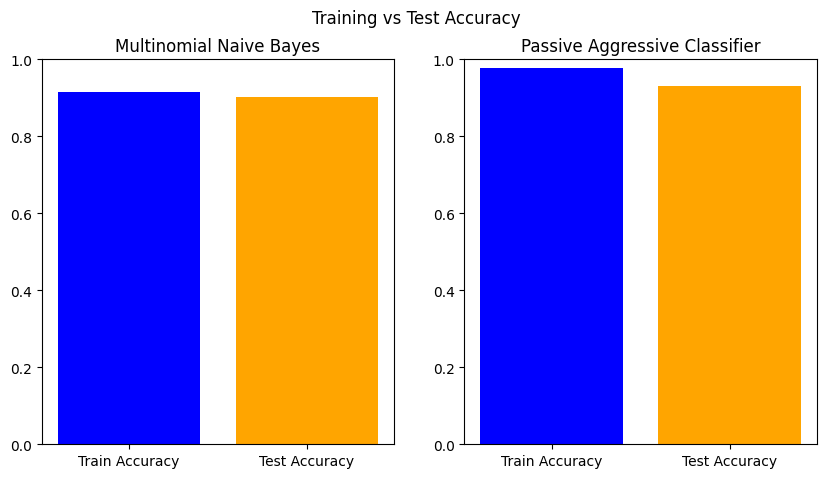

In [ ]:
# mnb: Multinomial Naive Bayes model
# passive: Passive Aggressive Classifier model

# Train the models
mnb.fit(count_train, y_train)
passive.fit(count_train, y_train)

# Get predictions for both training and test sets
train_pred_mnb = mnb.predict(count_train)
test_pred_mnb = mnb.predict(count_test)

train_pred_passive = passive.predict(count_train)
test_pred_passive = passive.predict(count_test)

# Calculate the evaluation metrics for both training and test sets
train_accuracy_mnb = metrics.accuracy_score(y_train, train_pred_mnb)
test_accuracy_mnb = metrics.accuracy_score(y_test, test_pred_mnb)

train_accuracy_passive = metrics.accuracy_score(y_train, train_pred_passive)
test_accuracy_passive = metrics.accuracy_score(y_test, test_pred_passive)

# Plot the results
plt.figure(figsize=(10, 5))

# Multinomial Naive Bayes
plt.subplot(1, 2, 1)
plt.bar(['Train Accuracy', 'Test Accuracy'], [train_accuracy_mnb, test_accuracy_mnb], color=['blue', 'orange'])
plt.ylim(0, 1)
plt.title('Multinomial Naive Bayes')

# Passive Aggressive Classifier
plt.subplot(1, 2, 2)
plt.bar(['Train Accuracy', 'Test Accuracy'], [train_accuracy_passive, test_accuracy_passive], color=['blue', 'orange'])
plt.ylim(0, 1)
plt.title('Passive Aggressive Classifier')

plt.suptitle('Training vs Test Accuracy')
plt.show()


## Drug Recommendation

In [ ]:
df_drug = df[(df['rating']>=9)&(df['usefulCount']>=100)].sort_values(by = ['rating', 'usefulCount'], ascending = [False, False])

In [ ]:
def recommend_drug(disease):
    recommended_drug_list = df_drug[df_drug['condition']==disease]['drugName'].head(3).tolist()
    return recommended_drug_list

In [ ]:
recommend_drug("GERD")

['Zantac 150', 'Ranitidine', 'Zantac']

## Predictions

In [ ]:
# df_test = df.groupby(['condition','drugName']).agg({'total_pred' : ['mean']})
# df_test

In [ ]:
# tfidf_trigrams_model has highest accuracy

with open('models/tfidf_trigrams_model.pkl', 'rb') as f:
    tfidf_trigrams_model = pickle.load(f)

with open('vectorizers/tfidf_vectorizer3.pkl', 'rb') as f:
    tfidf_vectorizer = pickle.load(f)


In [ ]:
text = ["Increased thirst. Frequent urination. Increased hunger. Unintended weight loss. Fatigue. Blurred vision. Slow-healing sores. Frequent infections."]
text_transformed = tfidf_vectorizer.transform(text)
prediction = tfidf_trigrams_model.predict(text_transformed)[0]
print("Predicted disease :", prediction)
recommend_drug(prediction)

Predicted disease : Diabetes, Type 2


['Victoza', 'Liraglutide', 'Canagliflozin']

In [ ]:
text = ["Difficulty falling asleep at night. Waking up during the night. Waking up too early. Not feeling well-rested after a night's sleep. Daytime tiredness or sleepiness. Irritability, depression or anxiety. Difficulty paying attention, focusing on tasks or remembering. Increased errors or accidents."]
text_transformed = tfidf_vectorizer.transform(text)
prediction = tfidf_trigrams_model.predict(text_transformed)[0]
print("Predicted disease recommend_drug(prediction):", prediction)
recommend_drug(prediction)

Predicted disease recommend_drug(prediction): Insomnia


['Trazodone', 'Clonazepam', 'Remeron']

In [ ]:
text = ["Crusting of skin bumps. Cysts. Papules (small red bumps) Pustules (small red bumps containing white or yellow pus) Redness around the skin eruptions. Scarring of the skin. Whiteheads. Blackheads."]
text_transformed = tfidf_vectorizer.transform(text)
prediction = tfidf_trigrams_model.predict(text_transformed)[0]
print("Predicted disease :", prediction)
recommend_drug(prediction)

Predicted disease : Acne


['Tretinoin', 'Spironolactone', 'Differin']

In [ ]:
text = ["Spotting between periods. Breakthrough bleeding, or spotting, refers to when vaginal bleeding occurs between menstrual cycles. Nausea. Breast tenderness. Headaches and migraine. Weight gain. Mood changes. Missed periods. Decreased libido."]
text_transformed = tfidf_vectorizer.transform(text)
prediction = tfidf_trigrams_model.predict(text_transformed)[0]
print("Predicted disease :", prediction)
recommend_drug(prediction)

Predicted disease : Birth Control


['Mirena', 'Levonorgestrel', 'Implanon']

In [ ]:
text = ["A burning sensation in your chest (heartburn), usually after eating, which might be worse at night or while lying down. Backwash (regurgitation) of food or sour liquid. Upper abdominal or chest pain. Trouble swallowing (dysphagia) Sensation of a lump in your throat."]
text_transformed = tfidf_vectorizer.transform(text)
prediction = tfidf_trigrams_model.predict(text_transformed)[0]
print("Predicted disease :", prediction)
recommend_drug(prediction)

Predicted disease : GERD


['Zantac 150', 'Ranitidine', 'Zantac']